# Algorithmic trading using Advanced Quantitative Strategy.
* Download/Load stocks prices data.
* Calculate different features and indicators on each stock.

In [1]:
!pip install mplfinance
!pip install pandas_datareader
!pip install yfinance
import pandas_datareader.data as web
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np
import yfinance as yf
from datetime import datetime as dt
import mplfinance as mpf
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


## 1. Moving Averages for price action

In [3]:
# get daily data from yfinance
def get_daily_data(symbol, start, end):
    data = yf.download(tickers=symbol, start=start, end=end)
    # data = nsepy.get_history(symbol=symbol, start=start, end=end)
    return data

# moving averages strategy on close price data
# [!] implement any strategy you like across all stocks in your portfolio
def ma(data,ma1,ma2):
    # calculating moving averages
    data['ma_short'] = data['Close'].ewm(span=ma1).mean().shift()
    data['ma_long'] = data['Close'].ewm(span=ma2).mean().shift()

    print('Inside MA function---->')
    print(data.round(decimals = 3).head(5))
    # creating positions
    # data["position"] = [0]*len(data)
    data['position'] = np.where(data["ma_short"] > data["ma_long"], 1, 0)    
    data["strategy_returns"] = data["bnh_returns"] * data["position"]
    print('End MA function---->')
    print(data.round(decimals = 3).head(5))
    # returning strategy returns
    return data["strategy_returns"]

# Cumulative returns fucntion
def get_cumulative_return(df):
    return list(df.cumsum())[-1]

#  Annualized sharpe ratio function 
def get_annualized_sharpe_ratio(df):
    return 252**(1/2) * (df.mean() / df.std())

In [4]:
# backtesting parameters
#Training Data - 9 months
# Testing Data - 3 months
days =365
end = dt.today() - pd.Timedelta(days=90)
temp_end = dt.today()
start = temp_end - pd.Timedelta(days=days)
print("Start date")
print(start)
print("End date")
print(end)
# portfolio of stocks
# portfolio_stocks = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'JPM', 'PYPL', 'NVDA',  # Add more symbols as needed
#                  'INTC', 'AMD', 'CSCO', 'IBM', 'GS', 'BA', 'GE', 'GM', 'WMT', 'DIS']

#portfolio_stocks = ['AAPL', 'MSFT']
portfolio_stocks = ['AAPL', 'MSFT', 'NVDA','AMD','GE','IBM', 'GS', 'BA', 'GM']

# portfolio_stocks = [
#     'AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'GOOG', 'NVDA', 'INTC', 'AMD',
#     'CSCO', 'IBM', 'ORCL', 'HPQ', 'QCOM', 'NFLX', 'GS', 'JPM', 'C', 'BAC',
#     'V', 'MA', 'PYPL', 'ADBE', 'CRM', 'AMGN', 'GILD', 'BIIB', 'MRK', 'PFE',
#     'JNJ', 'UNH', 'WMT', 'HD', 'DIS', 'MCD', 'NKE', 'VZ', 'T', 'CMCSA', 'PEP',
#     'KO', 'INTU', 'COST', 'BA', 'LMT', 'GE', 'MMM', 'HON', 'CAT', 'XOM',
#     'CVX', 'AAP', 'COP', 'XOM', 'MO', 'IBM', 'FDX', 'UPS', 'WBA', 'WFC',
#     'MS', 'GS', 'AXP', 'AIG', 'AAPL', 'GOOGL', 'AMZN', 'TSLA', 'GOOG',
#     'NVDA', 'INTC', 'AMD', 'CSCO', 'IBM', 'ORCL', 'HPQ', 'QCOM', 'NFLX', 'GS',
#     'JPM', 'C', 'BAC', 'V', 'MA', 'PYPL', 'ADBE', 'CRM', 'AMGN', 'GILD', 'BIIB',
#     'MRK', 'PFE', 'JNJ', 'UNH', 'WMT', 'HD', 'DIS', 'MCD', 'NKE', 'VZ', 'T'
# ]
# defining a data frame to store portfolio returns
portfolio_strategy_returns = pd.DataFrame()
portfolio_bnh_returns = pd.DataFrame()

# buy and hold returns for individual stocs
bnh_stock_returns = []
bnh_stock_sharpe = []

# iterating over stocks in the portfolio
for stock in portfolio_stocks:
    data = get_daily_data(stock, start, end)
    data.round(2)
    print('First Print')
    print(data.round(decimals = 3).head(5))
    # Calcuulating daily log returns using Adj Closing and 
    data["bnh_returns"] = np.log(data["Close"]/data["Close"].shift())
    print('Second Print')
    print(data.round(decimals = 3).head(5))
    portfolio_strategy_returns[stock] = ma(data,ma1 = 5, ma2 = 30)
    
    bnh_stock_returns.append(get_cumulative_return(data["strategy_returns"]))
    print('Third Print')
    print(bnh_stock_returns)
    bnh_stock_sharpe.append(get_annualized_sharpe_ratio(data["strategy_returns"]))

data.to_csv('C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading/Dataset.csv')

Start date
2023-05-08 18:52:13.200427
End date
2024-02-07 18:52:13.196578


[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close    Volume
Date                                                           
2023-05-08  172.48  173.85  172.11  173.50    172.579  55962800
2023-05-09  173.05  173.54  171.60  171.77    170.858  45326900
2023-05-10  173.02  174.03  171.90  173.56    172.639  53724500
2023-05-11  173.85  174.59  172.17  173.75    172.828  49514700
2023-05-12  173.62  174.06  171.00  172.57    171.891  45497800
Second Print
              Open    High     Low   Close  Adj Close    Volume  bnh_returns
Date                                                                        
2023-05-08  172.48  173.85  172.11  173.50    172.579  55962800          NaN
2023-05-09  173.05  173.54  171.60  171.77    170.858  45326900       -0.010
2023-05-10  173.02  174.03  171.90  173.56    172.639  53724500        0.010
2023-05-11  173.85  174.59  172.17  173.75    172.828  49514700        0.001
2023-05-12  173.62  174.06  171.00  172.57    171.891  45497800  

[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close    Volume
Date                                                           
2023-05-08  310.13  310.20  306.09  308.65    306.137  21318600
2023-05-09  308.00  310.04  306.31  307.00    304.501  21340800
2023-05-10  308.62  313.00  307.67  312.31    309.768  30078000
2023-05-11  310.10  311.12  306.26  310.11    307.586  31680200
2023-05-12  310.55  310.65  306.60  308.97    306.455  19758100
Second Print
              Open    High     Low   Close  Adj Close    Volume  bnh_returns
Date                                                                        
2023-05-08  310.13  310.20  306.09  308.65    306.137  21318600          NaN
2023-05-09  308.00  310.04  306.31  307.00    304.501  21340800       -0.005
2023-05-10  308.62  313.00  307.67  312.31    309.768  30078000        0.017
2023-05-11  310.10  311.12  306.26  310.11    307.586  31680200       -0.007
2023-05-12  310.55  310.65  306.60  308.97    306.455  19758100  

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close    Volume
Date                                                           
2023-05-08  285.22  292.20  283.50  291.51    291.417  34497900
2023-05-09  288.99  289.73  284.50  285.71    285.618  31486900
2023-05-10  290.05  291.13  284.61  288.85    288.757  36935000
2023-05-11  288.96  289.50  282.46  285.78    285.688  32214900
2023-05-12  285.29  287.80  280.46  283.40    283.309  27402700
Second Print
              Open    High     Low   Close  Adj Close    Volume  bnh_returns
Date                                                                        
2023-05-08  285.22  292.20  283.50  291.51    291.417  34497900          NaN
2023-05-09  288.99  289.73  284.50  285.71    285.618  31486900       -0.020
2023-05-10  290.05  291.13  284.61  288.85    288.757  36935000        0.011
2023-05-11  288.96  289.50  282.46  285.78    285.688  32214900       -0.011
2023-05-12  285.29  287.80  280.46  283.40    283.309  27402700  

[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close   Volume
Date                                                          
2023-05-08  79.984  80.694  79.984  80.543     80.190  4282128
2023-05-09  80.423  81.325  80.423  80.607     80.253  6520737
2023-05-10  80.990  81.141  78.579  79.441     79.093  5053224
2023-05-11  79.330  79.792  78.867  79.417     79.069  5117628
2023-05-12  79.473  79.808  77.981  78.851     78.505  4332874
Second Print
              Open    High     Low   Close  Adj Close   Volume  bnh_returns
Date                                                                       
2023-05-08  79.984  80.694  79.984  80.543     80.190  4282128          NaN
2023-05-09  80.423  81.325  80.423  80.607     80.253  6520737        0.001
2023-05-10  80.990  81.141  78.579  79.441     79.093  5053224       -0.015
2023-05-11  79.330  79.792  78.867  79.417     79.069  5117628       -0.000
2023-05-12  79.473  79.808  77.981  78.851     78.505  4332874       -0.007
In

[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close   Volume
Date                                                          
2023-05-08  123.76  123.92  122.55  123.40    117.930  3663800
2023-05-09  121.90  121.97  120.66  121.17    117.378  4540000
2023-05-10  121.99  122.49  121.10  122.02    118.201  4189200
2023-05-11  122.02  122.24  120.55  120.90    117.116  3446500
2023-05-12  121.41  122.86  121.11  122.84    118.996  4560500
Second Print
              Open    High     Low   Close  Adj Close   Volume  bnh_returns
Date                                                                       
2023-05-08  123.76  123.92  122.55  123.40    117.930  3663800          NaN
2023-05-09  121.90  121.97  120.66  121.17    117.378  4540000       -0.018
2023-05-10  121.99  122.49  121.10  122.02    118.201  4189200        0.007
2023-05-11  122.02  122.24  120.55  120.90    117.116  3446500       -0.009
2023-05-12  121.41  122.86  121.11  122.84    118.996  4560500        0.016
In

[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close   Volume
Date                                                          
2023-05-08  329.64  330.30  325.67  326.51    316.503  1607300
2023-05-09  325.04  327.18  323.30  324.77    314.816  1253300
2023-05-10  329.92  329.92  319.08  322.55    312.664  1752200
2023-05-11  319.66  321.94  318.18  320.72    310.890  1515200
2023-05-12  322.04  323.22  317.32  319.50    309.708  1098800
Second Print
              Open    High     Low   Close  Adj Close   Volume  bnh_returns
Date                                                                       
2023-05-08  329.64  330.30  325.67  326.51    316.503  1607300          NaN
2023-05-09  325.04  327.18  323.30  324.77    314.816  1253300       -0.005
2023-05-10  329.92  329.92  319.08  322.55    312.664  1752200       -0.007
2023-05-11  319.66  321.94  318.18  320.72    310.890  1515200       -0.006
2023-05-12  322.04  323.22  317.32  319.50    309.708  1098800       -0.004
In

[*********************100%%**********************]  1 of 1 completed


First Print
              Open    High     Low   Close  Adj Close   Volume
Date                                                          
2023-05-08  199.16  199.66  196.40  197.26     197.26  4677400
2023-05-09  201.21  204.61  198.78  201.88     201.88  9329500
2023-05-10  203.14  203.20  198.25  200.84     200.84  3923700
2023-05-11  199.39  202.55  198.07  201.84     201.84  3322000
2023-05-12  201.84  203.11  198.82  200.70     200.70  3168000
Second Print
              Open    High     Low   Close  Adj Close   Volume  bnh_returns
Date                                                                       
2023-05-08  199.16  199.66  196.40  197.26     197.26  4677400          NaN
2023-05-09  201.21  204.61  198.78  201.88     201.88  9329500        0.023
2023-05-10  203.14  203.20  198.25  200.84     200.84  3923700       -0.005
2023-05-11  199.39  202.55  198.07  201.84     201.84  3322000        0.005
2023-05-12  201.84  203.11  198.82  200.70     200.70  3168000       -0.006
In

[*********************100%%**********************]  1 of 1 completed

First Print
             Open   High    Low  Close  Adj Close    Volume
Date                                                       
2023-05-08  33.39  33.74  33.13  33.66     33.282  11267400
2023-05-09  33.32  33.57  33.06  33.28     32.906  11841900
2023-05-10  33.87  33.97  32.60  33.08     32.709  15418400
2023-05-11  32.85  33.28  32.85  33.12     32.748  12319500
2023-05-12  33.25  33.28  32.13  32.40     32.036  13026000
Second Print
             Open   High    Low  Close  Adj Close    Volume  bnh_returns
Date                                                                    
2023-05-08  33.39  33.74  33.13  33.66     33.282  11267400          NaN
2023-05-09  33.32  33.57  33.06  33.28     32.906  11841900       -0.011
2023-05-10  33.87  33.97  32.60  33.08     32.709  15418400       -0.006
2023-05-11  32.85  33.28  32.85  33.12     32.748  12319500        0.001
2023-05-12  33.25  33.28  32.13  32.40     32.036  13026000       -0.022
Inside MA function---->
             Open   

In [5]:
print("**************MOVING AVERAGE PORTFOLIO RETURNS**************")
portfolio_strategy_returns["Portfolio_rets"] = portfolio_strategy_returns.mean(axis=1) #calculate the daily mean return of portfolio
portfolio_strategy_returns.round(decimals = 4).head(10)
portfolio_strategy_returns.to_csv('C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading/MA_strategy.csv')
print(bnh_stock_returns)

**************MOVING AVERAGE PORTFOLIO RETURNS**************
[-0.07439174079009234, 0.2685148957295268, 0.6290641268011267, 0.3965388336565332, 0.23796693347970874, 0.37511851059810414, 0.016729100397111094, 0.1121946159245304, 0.2846386920543051]


In [6]:
perf = pd.DataFrame(index=portfolio_stocks,columns=["Cumulative Returns","Annualized Sharpe Ratio"])

for i,stock in enumerate(portfolio_stocks):
    cum_ret = bnh_stock_returns[i]*100
    anu_shp = bnh_stock_sharpe[i]
    perf.loc[stock] = [cum_ret,anu_shp]
    
perf

,Cumulative Returns,Annualized Sharpe Ratio
AAPL,-7.439174,-0.718919
MSFT,26.85149,1.848732
NVDA,62.906413,2.090841
AMD,39.653883,1.407757
GE,23.796693,1.804077
IBM,37.511851,2.945078
GS,1.67291,0.144073
BA,11.219462,0.633964
GM,28.463869,1.864594


In [7]:
portfolio_rets = portfolio_strategy_returns["Portfolio_rets"]
cumulative_return = get_cumulative_return(portfolio_rets) * 100
rounded_cumulative_return = round(cumulative_return, 2)
print("Cumulative Mean Return MA Strategy: {}%".format(rounded_cumulative_return))
portfolio_rets = portfolio_strategy_returns["Portfolio_rets"]
sharpe_ratio = get_annualized_sharpe_ratio(portfolio_rets)
rounded_sharpe_ratio = round(sharpe_ratio, 2)
print("Annualized Sharpe Ratio MA Strategy:", rounded_sharpe_ratio)
print("\n")

Cumulative Mean Return MA Strategy: 24.96%
Annualized Sharpe Ratio MA Strategy: 2.64




<Axes: title={'center': 'MOVING AVERAGES STRATEGY CUMULATIVE RETURNS'}, xlabel='Date'>

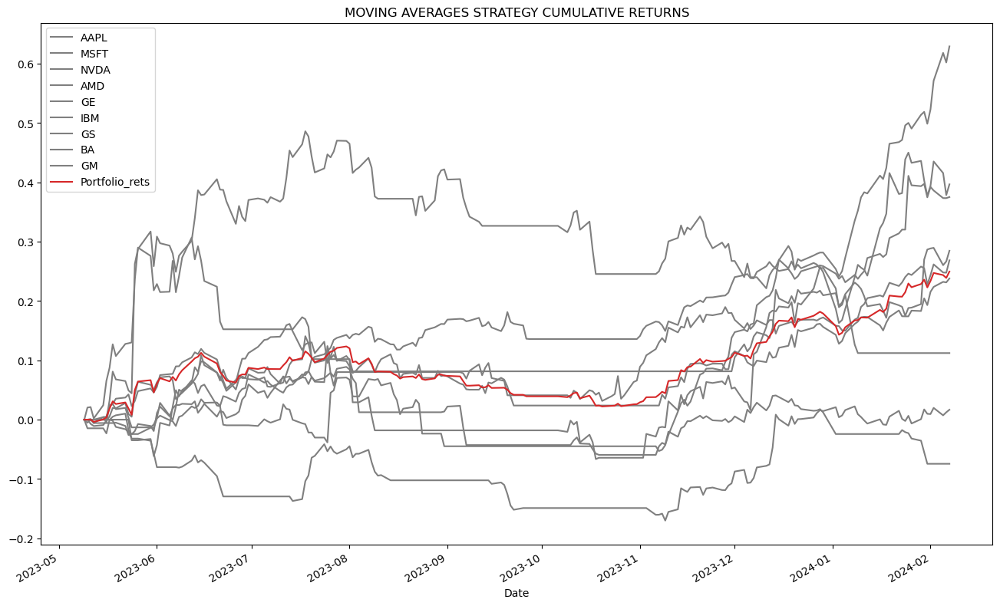

In [8]:
colors = ['tab:gray','tab:gray','tab:gray','tab:gray','tab:gray','tab:gray','tab:gray','tab:gray','tab:gray','tab:red',"k"]
portfolio_strategy_returns.cumsum().plot(figsize=(16,10), title="MOVING AVERAGES STRATEGY CUMULATIVE RETURNS", color=colors)

## 2. Bollinger Bands for price action

In [9]:

portfolio_dataset = pd.DataFrame()
for ticker in portfolio_stocks:
    portfolio_dataset[ticker] = yf.download(ticker,start,end)['Close'] # We only need the Adj close price moving forward
print(portfolio_dataset.round(decimals = 3).head(5))

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


              AAPL    MSFT    NVDA    AMD      GE     IBM      GS      BA  \
Date                                                                        
2023-05-08  173.50  308.65  291.51  95.04  80.543  123.40  326.51  197.26   
2023-05-09  171.77  307.00  285.71  95.06  80.607  121.17  324.77  201.88   
2023-05-10  173.56  312.31  288.85  97.02  79.441  122.02  322.55  200.84   
2023-05-11  173.75  310.11  285.78  97.10  79.417  120.90  320.72  201.84   
2023-05-12  172.57  308.97  283.40  95.26  78.851  122.84  319.50  200.70   

               GM  
Date               
2023-05-08  33.66  
2023-05-09  33.28  
2023-05-10  33.08  
2023-05-11  33.12  
2023-05-12  32.40  


In [10]:
#functions sma defined to calculate the simple moving average of all the stocks in portfolio
def sma(data, window):
    sma = data.rolling(window = window).mean()
    return sma

# def Bollinger_Bands(data, sma, window):
#     std = data.rolling(window = window).std()
#     print("inside bb")
#     upper_bb = sma + std * 2
#     lower_bb = sma - std * 2
#     print("AFTEER LIMIT CALC")
#     print(upper_bb)
#     print(lower_bb)
#     return upper_bb, lower_bb


In [11]:
portfolio_sma_20 = pd.DataFrame()
portfolio_bb_upper_limits = pd.DataFrame()
portfolio_bb_lower_limits = pd.DataFrame()

for ticker in portfolio_stocks:
    portfolio_sma_20[ticker] = sma(portfolio_dataset[ticker], 20)
   # print("inside bb")
    std = portfolio_dataset[ticker].rolling(window = 20).std()
    upper_bb = sma(portfolio_dataset[ticker], 20) + std * 2
    #print(upper_bb)
    lower_bb = sma(portfolio_dataset[ticker], 20) - std * 2
    portfolio_bb_upper_limits[ticker+"_upper_BB"] = upper_bb
    portfolio_bb_lower_limits[ticker+"_lower_BB"] = lower_bb


In [12]:
# Code to show onlt the bollinger bands along with stock price action
# for ticker in portfolio_stocks:
#     plt.figure(figsize=(10, 6))
#     portfolio_dataset[ticker].plot(label = 'CLOSE PRICES', color = 'skyblue')
#     portfolio_bb_upper_limits[ticker+'_upper_BB'].plot(label = 'UPPER BB 20', linestyle = '--', linewidth = 1, color = 'black')
#     portfolio_sma_20[ticker].plot(label = 'MIDDLE BB 20', linestyle = '--', linewidth = 1.2, color = 'grey')
#     portfolio_bb_lower_limits[ticker+'_lower_BB'].plot(label = 'LOWER BB 20', linestyle = '--', linewidth = 1, color = 'black')
#     plt.legend(loc = 'upper left')
#     plt.title(ticker+' BOLLINGER BANDS')
#     plt.show()

In [13]:
def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = 0
#     print("Length of Data")
#     print(len(data))
#     print("Incoming Data of Close price")
#     print(data)
    for i in range(len(data)):
#         print("data i-1")
#         print(data[i-1])
#         print("lower_bb[i-1]")
#         print(lower_bb[i-1])
#         print("data i")
#         print(data[i])
#         print("lower_bb[i]")
#         print(lower_bb[i])
#         print("First if condition")
#         print(data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i])
#         print("********************************")
#         print("upper_bb[i-1]")
#         print(upper_bb[i-1])
#         print("upper_bb[i]")
#         print(upper_bb[i])
#         print("Second if condition")
        #print(data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i])
        if data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i]:            
            if signal != 1:
                buy_price.append(data[i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(data[i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
            
        #if data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i]:
#             if signal != 1:
#                 buy_price.append(data[i])
#                 sell_price.append(np.nan)
#                 signal = 1
#                 bb_signal.append(signal)
#             else:
#                 buy_price.append(np.nan)
#                 sell_price.append(np.nan)
#                 bb_signal.append(0)
#         elif data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i]:
#             if signal != -1:
#                 buy_price.append(np.nan)
#                 sell_price.append(data[i])
#                 signal = -1
#                 bb_signal.append(signal)
#             else:
#                 buy_price.append(np.nan)
#                 sell_price.append(np.nan)
#                 bb_signal.append(0)
#         else:
#             buy_price.append(np.nan)
#             sell_price.append(np.nan)
#             bb_signal.append(0)
            
    return buy_price, sell_price, bb_signal



In [14]:
buy_price = pd.DataFrame()
sell_price = pd.DataFrame()
bb_signal = pd.DataFrame()
for ticker in portfolio_stocks:

    buy_price[ticker], sell_price[ticker], bb_signal[ticker] = implement_bb_strategy(portfolio_dataset[ticker], portfolio_bb_lower_limits[ticker+'_lower_BB'], portfolio_bb_upper_limits[ticker+"_upper_BB"])
    

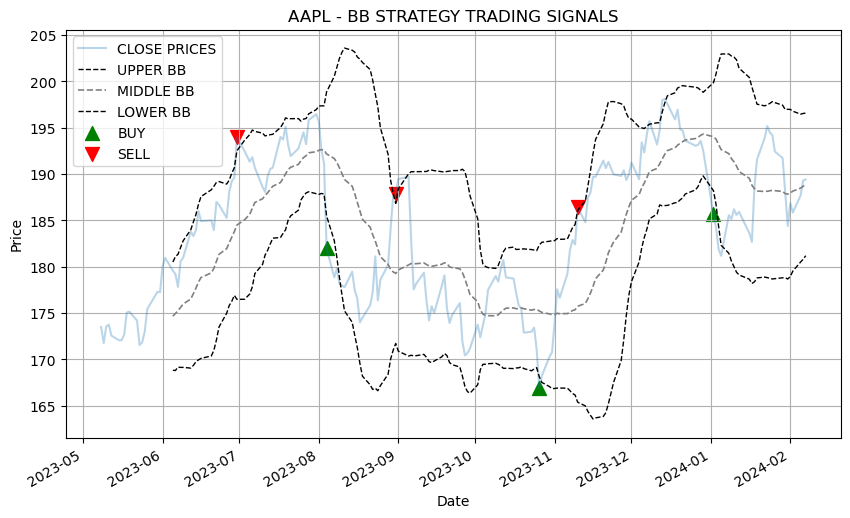

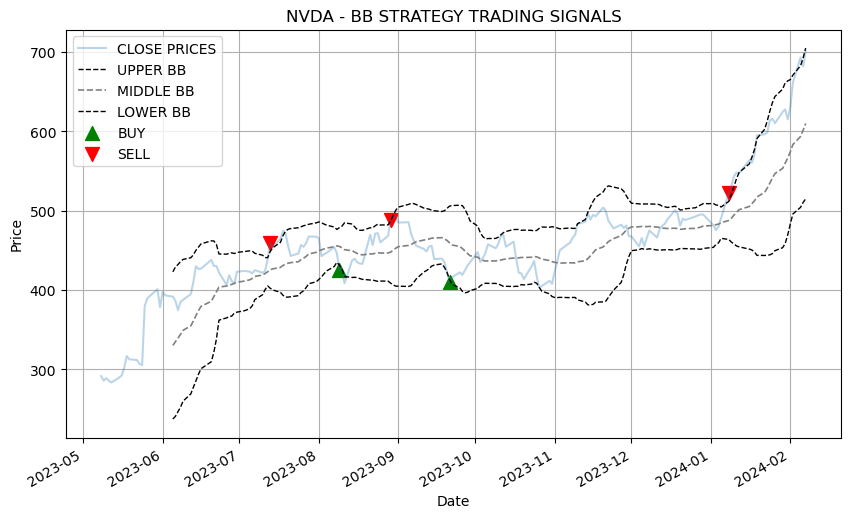

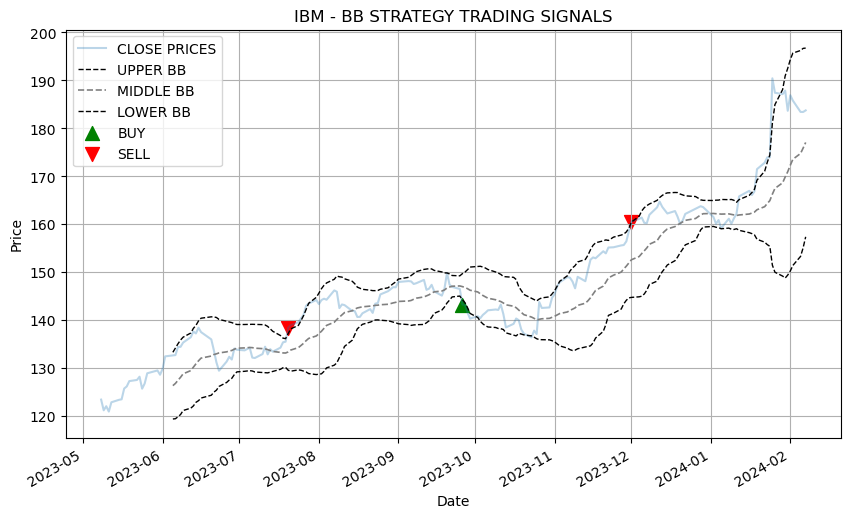

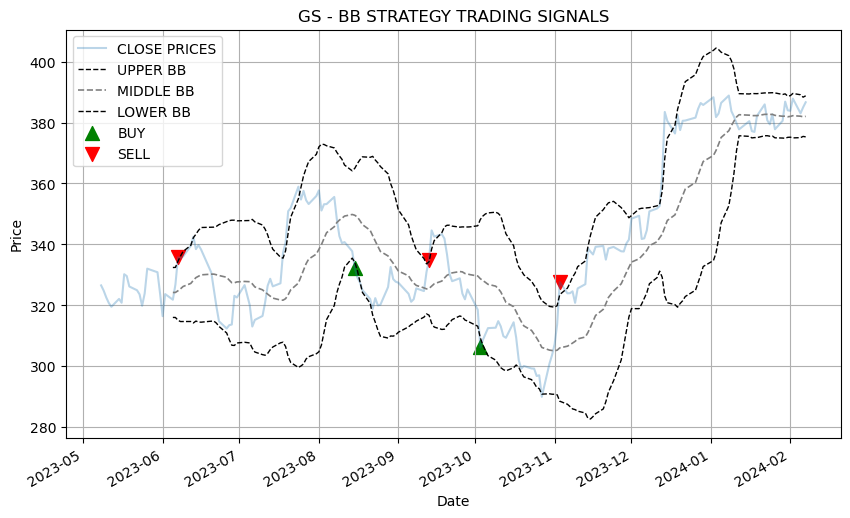

In [15]:
bb_portfolio_list = ['AAPL', 'NVDA','IBM', 'GS']

for ticker in bb_portfolio_list:
    plt.figure(figsize=(10, 6)) 
    
    portfolio_dataset[ticker].plot(label='CLOSE PRICES', alpha=0.3)
    portfolio_bb_upper_limits[ticker+"_upper_BB"].plot(label='UPPER BB', linestyle='--', linewidth=1, color='black')
    portfolio_sma_20[ticker].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
    portfolio_bb_lower_limits[ticker+'_lower_BB'].plot(label='LOWER BB', linestyle='--', linewidth=1, color='black')
    
    plt.scatter(portfolio_dataset[ticker].index, buy_price[ticker], marker='^', color='green', label='BUY', s=100)
    plt.scatter(portfolio_dataset[ticker].index, sell_price[ticker], marker='v', color='red', label='SELL', s=100)
    
    plt.title(f'{ticker} - BB STRATEGY TRADING SIGNALS')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='upper left')
    plt.grid(True) 
    plt.show()

In [16]:
buy_price.to_csv('C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading/Buy_profit.csv')
sell_price.to_csv('C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading/Sell_profit.csv')

In [17]:
buy_price

,AAPL,MSFT,NVDA,AMD,GE,IBM,GS,BA,GM
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
buy_price

,AAPL,MSFT,NVDA,AMD,GE,IBM,GS,BA,GM
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import yfinance as yf
import os
plt.style.use('ggplot')

data_folder = 'C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading'

sentiment_df = pd.read_csv(os.path.join(data_folder, 'sentiment_data.csv')) #read the twitter sentiment data 

sentiment_df['date'] = pd.to_datetime(sentiment_df['date']) #Convert to date using function

sentiment_df = sentiment_df.set_index(['date', 'symbol'])

sentiment_df['engagement_ratio'] = sentiment_df['twitterComments']/sentiment_df['twitterLikes'] #engagement_ratio

sentiment_df = sentiment_df[(sentiment_df['twitterLikes']>20)&(sentiment_df['twitterComments']>10)] #twitterLikes>20 and twitterComments>10

sentiment_df

twitterPosts  twitterComments  twitterLikes  \
date       symbol                                                
2021-11-18 AAPL           811.0           2592.0       21674.0   
           AMD            150.0            675.0        2949.0   
           AMZN           557.0           1315.0       12969.0   
           ATVI            82.0             36.0         131.0   
           BA              61.0             55.0         342.0   
           CRM             25.0           7183.0       29832.0   
           ES              54.0            308.0        1008.0   
           F              171.0           7014.0       47637.0   
           GOOG            49.0             51.0         181.0   
           GOOGL          102.0            279.0        1704.0   
           JPM             27.0             17.0         155.0   
           META            94.0            178.0        1066.0   
           MNST            32.0             23.0          84.0   
           MSFT            69.0            538.0        1824.0   
           NFLX            38.0            201.0        1093.0   
           NKE            108.0            365.0        2109.0   
           NVDA           304.0           1375.0       13896.0   
           PFE             61.0            111.0         516.0   
           TSLA           933.0          27741.0      234301.0   
2021-11-19 AAPL          2379.0          22985.0      157720.0   
           ABBV            56.0            894.0        5618.0   
           ABT             84.0             18.0          43.0   
           AMD            394.0           1611.0        7820.0   
           AMZN          1530.0           4281.0       28530.0   
           ATVI           180.0            121.0         830.0   
           BA             619.0            173.0         777.0   
           C              100.0            439.0        1678.0   
           CMG             47.0             82.0         259.0   
           CRM            158.0          12680.0       58315.0   
           DIS            364.0             82.0         532.0   
           EA              62.0             24.0         118.0   
           EBAY            99.0             37.0          88.0   
           ES             367.0            575.0        4361.0   
           F              825.0          23127.0      168966.0   
           FCX            133.0            370.0         797.0   
           GOOG           346.0           2842.0       34681.0   
           GOOGL          549.0           3149.0       23800.0   
           GS             117.0            177.0         528.0   
           JPM            206.0           4989.0        7627.0   
           K               35.0           2544.0        9231.0   
           KEY            156.0            181.0         654.0   
           KO              47.0             28.0         176.0   
           MA             121.0             78.0         823.0   
           META           748.0           1258.0        5522.0   
           MNST           172.0            768.0         633.0   
           MO              47.0            253.0         931.0   
           MSFT           363.0            207.0        2572.0   
           MU             526.0            219.0        2454.0   
           NFLX           237.0            306.0        2204.0   
           NKE            298.0            837.0        4077.0   
           NVDA          1312.0           4667.0       44035.0   
           PEP             74.0            222.0        2588.0   
           PFE            604.0             90.0         290.0   
           STZ             21.0             22.0          70.0   
           T              249.0            430.0        1487.0   
           TSLA          5051.0          66152.0      604286.0   
           TSN             33.0             35.0         132.0   
           V              213.0           1090.0        6149.0   
2021-11-20 AAPL           638.0           6557.0       5121

## 2. Aggregate Monthly and calculate average sentiment for the month

* Aggregate on a monthly level and calculate average monthly metric, for the one we choose.

In [20]:
aggragated_df = (sentiment_df.reset_index('symbol').groupby([pd.Grouper(freq='M'), 'symbol'])
                    [['engagement_ratio']].mean())

aggragated_df['rank'] = (aggragated_df.groupby(level=0)['engagement_ratio']
                         .transform(lambda x: x.rank(ascending=False)))

aggragated_df.to_csv('C:/Users/Ritvi Shah/Documents/Python Scripts/algo trading/Twitter_engageement.csv')

## 3. Select Top 5 Stocks based on their cross-sectional ranking for each month

* Select top 5 stocks by rank for each month and fix the date to start at beginning of next month.

In [21]:
filtered_df = aggragated_df[aggragated_df['rank']<6].copy()

filtered_df = filtered_df.reset_index(level=1)

filtered_df.index = filtered_df.index+pd.DateOffset(1)

filtered_df = filtered_df.reset_index().set_index(['date', 'symbol'])

filtered_df.head(20)

engagement_ratio  rank
date       symbol                        
2021-12-01 AES             0.864613   2.0
           FCX             0.626323   5.0
           MNST            0.699721   3.0
           OXY             2.147741   1.0
           SLB             0.647374   4.0
2022-01-01 D               0.801994   5.0
           FCX             0.841220   4.0
           L               6.507246   1.0
           LUV             1.303215   2.0
           MA              0.883401   3.0
2022-02-01 AMD             0.715556   4.0
           D               1.136678   1.0
           FCX             0.655237   5.0
           LUV             1.035258   2.0
           MA              0.729063   3.0
2022-03-01 FCX             1.138332   2.0
           GILD            0.530886   5.0
           LUV             1.574377   1.0
           MRO             0.581748   4.0
           OXY             1.025579   3.0

## 4. Extract the stocks to form portfolios with at the start of each new month

* Create a dictionary containing start of month and corresponded selected stocks.

In [22]:
dates = filtered_df.index.get_level_values('date').unique().tolist()

fixed_dates = {}

for d in dates:
    
    fixed_dates[d.strftime('%Y-%m-%d')] = filtered_df.xs(d, level=0).index.tolist()
    
fixed_dates

{'2021-12-01': ['AES', 'FCX', 'MNST', 'OXY', 'SLB'],
 '2022-01-01': ['D', 'FCX', 'L', 'LUV', 'MA'],
 '2022-02-01': ['AMD', 'D', 'FCX', 'LUV', 'MA'],
 '2022-03-01': ['FCX', 'GILD', 'LUV', 'MRO', 'OXY'],
 '2022-04-01': ['A', 'CRM', 'PFE', 'PM', 'STZ'],
 '2022-05-01': ['AMD', 'CRM', 'CVX', 'J', 'KEY'],
 '2022-06-01': ['AMD', 'DD', 'FCX', 'KEY', 'LMT'],
 '2022-07-01': ['CB', 'CRM', 'DD', 'FCX', 'STZ'],
 '2022-08-01': ['A', 'DD', 'JPM', 'REGN', 'STZ'],
 '2022-09-01': ['ABT', 'DIS', 'L', 'META', 'MRNA'],
 '2022-10-01': ['J', 'KEY', 'L', 'META', 'MU'],
 '2022-11-01': ['A', 'DD', 'FCX', 'J', 'META'],
 '2022-12-01': ['AEP', 'AES', 'DD', 'J', 'STZ'],
 '2023-01-01': ['A', 'AES', 'DAL', 'J', 'KEY'],
 '2023-02-01': ['A', 'AES', 'BIIB', 'FCX', 'MDT']}

In [23]:
stocks_list = sentiment_df.index.get_level_values('symbol').unique().tolist()
stocks_list.remove("ATVI")
prices_df = yf.download(tickers=stocks_list,
                        start='2021-01-01',
                        end='2023-03-01')

[*********************100%%**********************]  84 of 84 completed


In [24]:
returns_df = np.log(prices_df['Adj Close']).diff().dropna()

portfolio_df = pd.DataFrame()

for start_date in fixed_dates.keys():
    
    end_date = (pd.to_datetime(start_date)+pd.offsets.MonthEnd()).strftime('%Y-%m-%d')
    
    cols = fixed_dates[start_date]
    
    temp_df = returns_df[start_date:end_date][cols].mean(axis=1).to_frame('portfolio_return')
    
    portfolio_df = pd.concat([portfolio_df, temp_df], axis=0)
    
portfolio_df

,portfolio_return
Date,
2021-12-01,-0.016417
2021-12-02,0.024872
2021-12-03,-0.007711
2021-12-06,0.023926
2021-12-07,0.030547
2021-12-08,0.001167
2021-12-09,-0.011651
2021-12-10,0.007106
2021-12-13,-0.025418


In [25]:
qqq_df = yf.download(tickers='QQQ',
                     start='2021-01-01',
                     end='2023-03-01')

qqq_ret = np.log(qqq_df['Adj Close']).diff().to_frame('nasdaq_return')

portfolio_df = portfolio_df.merge(qqq_ret,
                                  left_index=True,
                                  right_index=True)

portfolio_df

[*********************100%%**********************]  1 of 1 completed


,portfolio_return,nasdaq_return
Date,,
2021-12-01,-0.016417,-0.017159
2021-12-02,0.024872,0.007181
2021-12-03,-0.007711,-0.017542
2021-12-06,0.023926,0.007981
2021-12-07,0.030547,0.029670
2021-12-08,0.001167,0.004464
2021-12-09,-0.011651,-0.014824
2021-12-10,0.007106,0.010812
2021-12-13,-0.025418,-0.014552


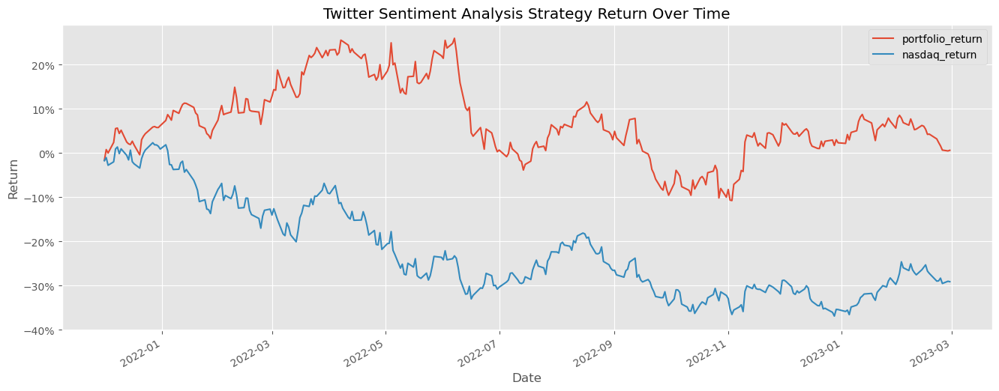

In [28]:
import matplotlib.ticker as mtick

portfolios_cumulative_return = np.exp(np.log1p(portfolio_df).cumsum()).sub(1)

portfolios_cumulative_return.plot(figsize=(16,6))

plt.title('Twitter Sentiment Analysis Strategy Return Over Time')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.ylabel('Return')

plt.show()